# Text Mining 

# Import library 

In [1]:
import numpy as np 
import pandas as pd
import re
import nltk
import sklearn
import seaborn as sns
import seaborn as sb
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
%matplotlib inline

# Loading dataset

In [2]:
# load the dataset and take a look at the first few records
df = pd.read_csv('London_hotel_reviews.csv', encoding = "ISO-8859-1")
print(df.shape)
df.head()

(27330, 6)


,Property_Name,Review_Rating,Review_Title,Review_Text,Location_Of_The_Reviewer,Date_Of_Review
0,Apex London Wall Hotel,5,Ottima qualità prezzo,Siamo stati a Londra per un week end ed abbiam...,"Casale Monferrato, Italy",10/20/2012
1,Corinthia Hotel London,5,"By far, my best hotel in the world",I had a pleasure of staying in this hotel for ...,"Savannah, Georgia",3/23/2016
2,The Savoy,5,First visit to the American Bar at the Savoy,A very lovely first visit to this iconic hotel...,London,7/30/2013
3,Rhodes Hotel,4,Nice stay,3 of us stayed at the Rhodes Hotel for 4 night...,"Maui, Hawaii",06-02-2012
4,The Savoy,5,Perfection,Form the moment we arrived until we left we ex...,"London, United Kingdom",11/24/2017


 This is dataset of 27,330 rows and 6 columns, each representing an individual review of some hotel. First I'll check if there are any NaN values and display some of them. 

## Data Preprocessing

In [3]:
print(df.isna().sum(), end = '\n\n')
df[df.isnull().any(axis=1)].head()

Property_Name                  0
Review_Rating                  0
Review_Title                   0
Review_Text                    0
Location_Of_The_Reviewer    3953
Date_Of_Review                 1
dtype: int64



,Property_Name,Review_Rating,Review_Title,Review_Text,Location_Of_The_Reviewer,Date_Of_Review
5,Corinthia Hotel London,1,Staff stole from me!!,Well I am no strange to London's 5star hotels ...,NaN,03-01-2013
24,Mondrian London at Sea Containers,5,"Fantastic nights stay, one of the best hotels ...",My partner and I found this hotel by chance an...,NaN,6/20/2015
34,Mondrian London at Sea Containers,5,Just as good second time around!,After an amazing experience the first time we ...,NaN,10/15/2015
37,The Rembrandt,5,Good Hotel - Great Area,Very good hotel in a lovely area. Handy to the...,NaN,11-04-2016
45,Apex London Wall Hotel,4,Eccellente,"In tutto, dalla struttura nuova in stile moder...",NaN,4/30/2013


The "Location Of The Reviewer" column has a large number of NaN values, with the "Date Of Review" column containg two missing values. We can take a look at that.

In [4]:
df[df["Date_Of_Review"].isnull()]

,Property_Name,Review_Rating,Review_Title,Review_Text,Location_Of_The_Reviewer,Date_Of_Review
6556,The Lanesborough,4,<U+0412> <U+043F><U+043E><U+0434><U+0440><U+04...,<U+041E><U+0442><U+0435><U+043B><U+044C> : | <...,NaN,NaN


Something wrong there - probably the review was written in a different language and the characters couldn't be displayed. I'll check if there are others like it.

In [5]:
print(len(df[df['Review_Title'].str.contains("<U")]), 'reviews that are probably gibberish.')
df[df['Review_Title'].str.contains("<U")].head()

431 reviews that are probably gibberish.


,Property_Name,Review_Rating,Review_Title,Review_Text,Location_Of_The_Reviewer,Date_Of_Review
90,The Dorchester,5,<U+0391><U+03B3><U+03B3><U+03BB><U+03B9><U+03B...,e<U+03B9><U+03BD>a<U+03B9> e<U+03BD>a<U+03C2> ...,"Athens, Greece",7/18/2017
174,Corinthia Hotel London,5,<U+041B><U+0443><U+0447><U+0448><U+0438><U+043...,<U+0423><U+0440><U+043E><U+0432><U+0435><U+043...,Zurich,2/17/2016
178,"Mandarin Oriental Hyde Park, London",5,<U+512A><U+96C5><U+306A><U+6642><U+9593><U+304...,<U+5148><U+6708><U+3001><U+304A><U+98DF><U+4E8...,"Aichi Prefecture, Japan",11/20/2015
328,The Savoy,5,<U+C544><U+B984><U+B2F5><U+ACE0> <U+C6B0><U+C5...,<U+CE5C><U+C808><U+D558><U+ACE0> <U+C720><U+CF...,NaN,5/15/2017
364,45 Park Lane - Dorchester Collection,5,<U+041C><U+043E><U+0434><U+043D><U+044B><U+043...,<U+041E><U+0442><U+0435><U+043B><U+044C> <U+04...,"Moscow, Russia",09-01-2015


The different language and the characters couldn't be displayed. 

In [6]:
df = df[df['Review_Title'].str.contains("<U") == False]

#### These can be removed.

# Explotation of Data

Lets explore the dataset a bit to see if we can find any trends. But before that, we will change the default plot size to have a better view of the plots.

In [7]:
plot_size=plt.rcParams["figure.figsize"]
print(plot_size[0])
print(plot_size[1])

plot_size[0]=8
plot_size[1]=6
plot_size=plt.rcParams["figure.figsize"]

6.0
4.0


Lets first seen tha number of review for each property name, we will plot a pie chart for that.

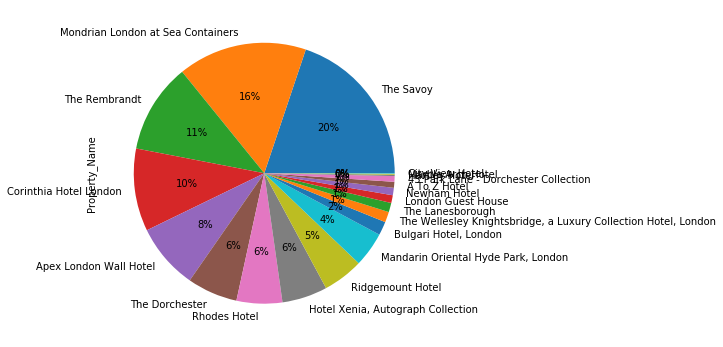

In [8]:
df.Property_Name.value_counts().plot(kind='pie',autopct='%1.0f%%')

 Lets we see the distrubution of the property name across the all review

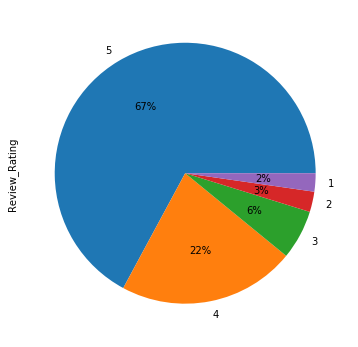

In [9]:
df.Review_Rating.value_counts().plot(kind='pie',autopct='%1.0f%%')

Here we can see in pie chart of most of the review are rating five. That is positive reviews.

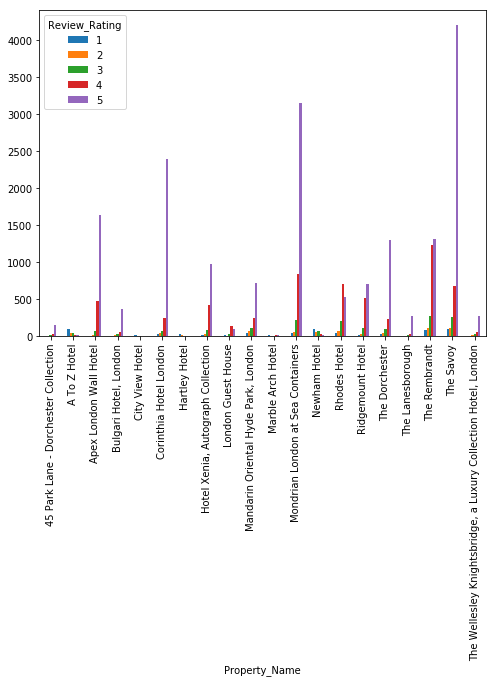

In [10]:
Review=df.groupby(['Property_Name','Review_Rating']).Review_Rating.count().unstack()
Review.plot(kind='bar')

[Text(0, 0, 'The Savoy'),
 Text(0, 0, 'Mondrian London at Sea Containers'),
 Text(0, 0, 'The Rembrandt'),
 Text(0, 0, 'Corinthia Hotel London'),
 Text(0, 0, 'Apex London Wall Hotel'),
 Text(0, 0, 'The Dorchester'),
 Text(0, 0, 'Rhodes Hotel'),
 Text(0, 0, 'Hotel Xenia, Autograph Collection'),
 Text(0, 0, 'Ridgemount Hotel'),
 Text(0, 0, 'Mandarin Oriental Hyde Park, London'),
 Text(0, 0, 'Bulgari Hotel, London'),
 Text(0, 0, 'The Wellesley Knightsbridge, a Luxury Collection Hotel, London'),
 Text(0, 0, 'The Lanesborough'),
 Text(0, 0, 'London Guest House'),
 Text(0, 0, 'Newham Hotel'),
 Text(0, 0, 'A To Z Hotel'),
 Text(0, 0, '45 Park Lane - Dorchester Collection'),
 Text(0, 0, 'Hartley Hotel'),
 Text(0, 0, 'Marble Arch Hotel'),
 Text(0, 0, 'City View Hotel')]

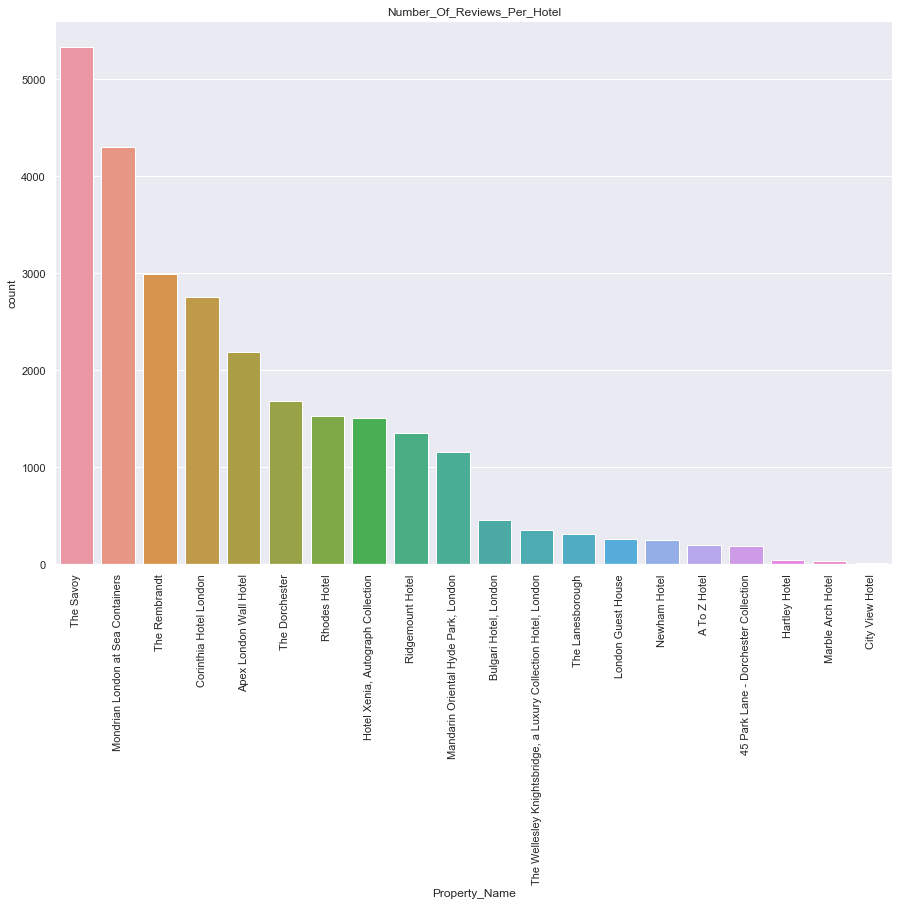

In [11]:
sns.set(rc={'figure.figsize':(15,10)}) # this will set the size of all the following graphs (default is too small)
grid = sb.countplot(x = 'Property_Name', data = df, order = df['Property_Name'].value_counts().index)
grid.set_title('Number_Of_Reviews_Per_Hotel')
grid.set_xticklabels(grid.get_xticklabels(), rotation=90)

We can see the above barplot in most frequency of number of review is "The Savoy" restorent. and second highest restorent is "Mondrian London at Sea Containers".

Text(0.5, 1.0, 'Number_Of_Ratings')

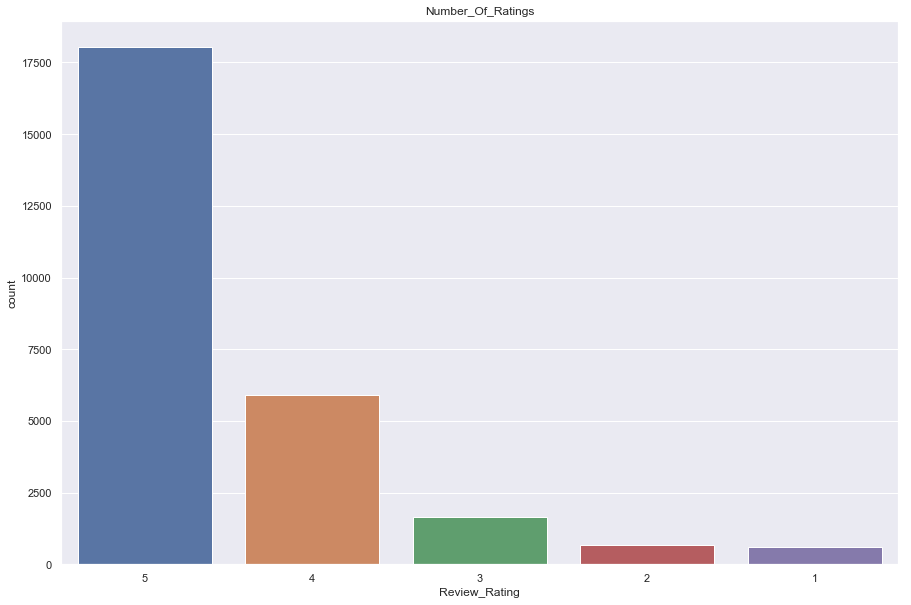

In [12]:
grid = sb.countplot(x = 'Review_Rating', data = df, order = df['Review_Rating'].value_counts().index)
grid.set_title('Number_Of_Ratings')

 What about the average rating for each hotel? To do this I'll make a new dataframe with two columns ("Property Name" and "Average Rating"), calculate the average rating of each hotel, and then add each hotel name and its average rating to the dataframe. A dataframe can be displayed as a graph very easily. 



# Get average review rating for each hotel


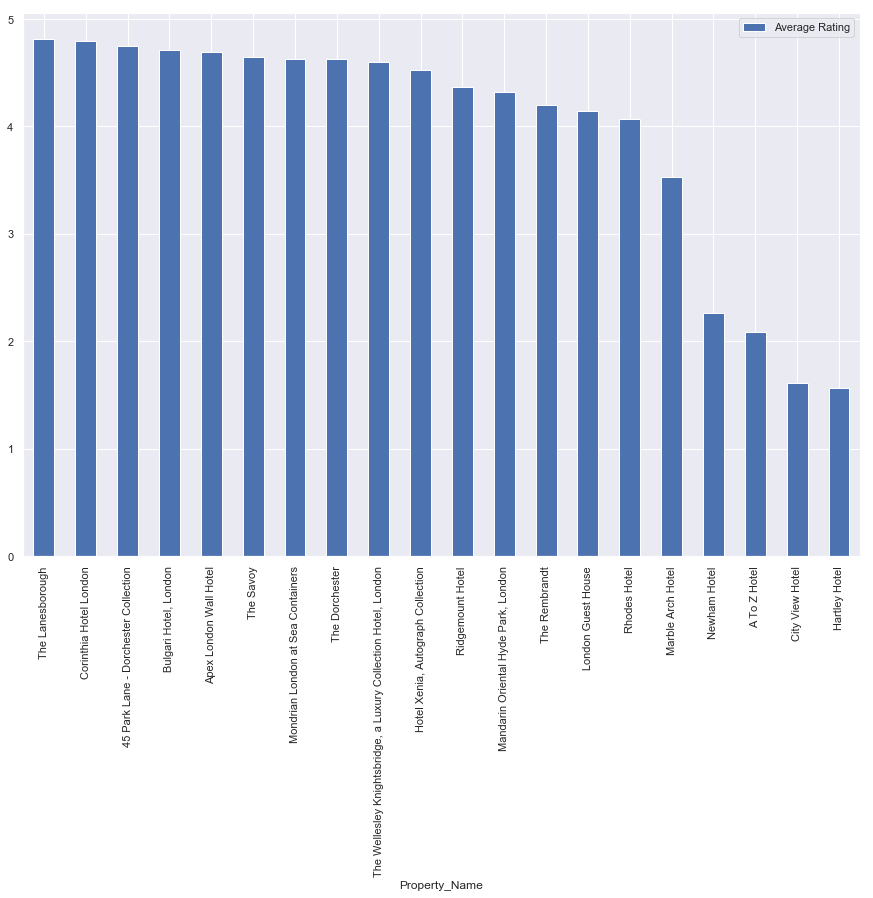

In [13]:
avg_rating = pd.DataFrame(columns = ['Property_Name', 'Average Rating'])
count = 0
for i in df['Property_Name'].unique():
    average_rating = sum(df['Review_Rating'][df['Property_Name'] == i]) / sum(df['Property_Name'] == i)
    avg_rating.loc[count] = [i, average_rating]
    count += 1 
avg_rating = avg_rating.sort_values('Average Rating', ascending = False)
avg_rating.plot(kind = 'bar', x = 'Property_Name')

So the majority of hotels here are very good, with a handful of very bad ones. The next graph I'll make is a count of the locations of reviewers. Looking at the "Location Of The Reviewer" column, many entries are of the pattern (city), (country) eg. "London, United Kingdom" (though for US locations it'll be (city), (state) like "Broomfield, Colorado"). To return countries I'll make a new column that is everything after the last comma (,) if there is a comma in the location of the reviewer. Then I'll display the most common 20 locations.

## Bag of word 

## Labrary Import

In [17]:
# pip install nltk
# loading NLTK
import nltk
# nltk.download()
import pandas as pd
import matplotlib.pyplot as plt
from nltk.tokenize import sent_tokenize 
from nltk.probability import FreqDist
import re
import string
import random
#nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer
#nltk.download('wordnet')

## Data Import

In [18]:
Review = pd.read_csv('text.txt', delimiter = '\t', quoting = 3)
print(len(Review))
Review.head()

26899


,Complete_Review,Good_Review
0,Ottima qualità prezzo Siamo stati a Londra per...,1
1,"By far, my best hotel in the world I had a ple...",1
2,First visit to the American Bar at the Savoy A...,1
3,Nice stay 3 of us stayed at the Rhodes Hotel f...,0
4,Perfection Form the moment we arrived until we...,1


## Data Cleaning

In [20]:
corpus = []
for i in range(0, 26000):
    review = re.sub('[^a-zA-Z]', ' ', Review['Complete_Review'][i])
    review = review.lower()
    review = review.split()
    ps = PorterStemmer()
    review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
    review = ' '.join(review)
    corpus.append(review)

In [21]:
data=str(corpus)
data

"['ottima qualit prezzo siamo stati londra per un week end ed abbiamo alloggiato questo ottimo hotel prenotato da amici personal molto gentil e disponibil camer sufficientement grandi soprattutto pulit e confortevoli con un letto matrimonial grand e comodo tv grand impianto stereo bose bagno grand con asciugacapelli vasca da bagno doccia accappatoio ciabatt ecc soprattutto pulito ottima posizion sebben sia nella zona finanziaria e quindi il fine settimana praticament deserta per noi stato fors un vantaggio per la tranquillit e visto che pochi minuti si raggiungono zone molto vivaci ogni caso muoversi non un problema la metro di moorgat due passi co come la stazion della metro e dei treni liverpool street treno con collegamento diretto aeroporto di stanst nel periodo cui siamo stati noi stavano ristrutturando e quindi probabilment oggi sar ancora meglio da tornar e da consigliar abbiamo speso per notti senza colazion evitata visto il costo e le opinioni neg sterlin', 'far best hotel wor

In [22]:
corpus = nltk.sent_tokenize(data)

In [23]:
for i in range(len(corpus)):
    corpus [i] = corpus[i].lower()
    corpus [i] = re.sub(r'\W',' ', corpus [i])
    corpus [i] = re.sub(r'\s+',' ', corpus [i])

In [24]:
print(len(corpus))

1


## Word Frequency distribution.

In [25]:
wordfreq = {}
for sentence in corpus:
    tokens = nltk.word_tokenize(sentence)
    for token in tokens:
        if token not in wordfreq.keys():
            wordfreq[token] = 1
        else:
            wordfreq[token] += 1
wordfreq

{'ottima': 453,
 'qualit': 496,
 'prezzo': 252,
 'siamo': 217,
 'stati': 103,
 'londra': 673,
 'per': 2176,
 'un': 3849,
 'week': 1447,
 'end': 2023,
 'ed': 406,
 'abbiamo': 342,
 'alloggiato': 25,
 'questo': 430,
 'ottimo': 326,
 'hotel': 48335,
 'prenotato': 42,
 'da': 2414,
 'amici': 23,
 'personal': 584,
 'molto': 1006,
 'gentil': 236,
 'e': 6536,
 'disponibil': 213,
 'camer': 349,
 'sufficientement': 12,
 'grandi': 49,
 'soprattutto': 74,
 'pulit': 118,
 'confortevoli': 43,
 'con': 2060,
 'letto': 147,
 'matrimonial': 36,
 'grand': 1012,
 'comodo': 96,
 'tv': 1526,
 'impianto': 4,
 'stereo': 8,
 'bose': 89,
 'bagno': 371,
 'asciugacapelli': 10,
 'vasca': 75,
 'doccia': 110,
 'accappatoio': 10,
 'ciabatt': 8,
 'ecc': 34,
 'pulito': 170,
 'posizion': 494,
 'sebben': 3,
 'sia': 158,
 'nella': 193,
 'zona': 329,
 'finanziaria': 2,
 'quindi': 108,
 'il': 2096,
 'fine': 1091,
 'settimana': 36,
 'praticament': 30,
 'deserta': 4,
 'noi': 112,
 'stato': 195,
 'fors': 59,
 'vantaggio': 4,
 

In [26]:
word_frequency =pd.Series(wordfreq)
word_frequency.head()

ottima    453
qualit    496
prezzo    252
siamo     217
stati     103
dtype: int64

In [27]:
WordFrequency = pd.DataFrame(word_frequency)
WordFrequency.reset_index()
WordFrequency.head()

,0
ottima,453
qualit,496
prezzo,252
siamo,217
stati,103


In [28]:
WordFrequency = pd.DataFrame(word_frequency)
WordFrequency.head()
WordFrequency['Word'] = WordFrequency.index
print(WordFrequency.shape)
WordFrequency.head()

(44375, 2)


,0,Word
ottima,453,ottima
qualit,496,qualit
prezzo,252,prezzo
siamo,217,siamo
stati,103,stati


### Create new data frame with column name "Frequency" and "Word".

In [29]:
WordFrequency.rename(columns={0:"Frequency"}, inplace=True)
WordFrequency.head()

,Frequency,Word
ottima,453,ottima
qualit,496,qualit
prezzo,252,prezzo
siamo,217,siamo
stati,103,stati


In [30]:
WordFrequency.reset_index(drop=True).head()

,Frequency,Word
0,453,ottima
1,496,qualit
2,252,prezzo
3,217,siamo
4,103,stati


## Sorting data frame by Frequency

In [31]:
WordFrequency.sort_values("Frequency", axis = 0, ascending = False, 
                 inplace = True, na_position ='last') 
WordFrequency.reset_index(drop=True).head(15)

,Frequency,Word
0,48335,hotel
1,38519,room
2,27073,stay
3,18395,staff
4,17309,london
5,15348,great
6,14462,servic
7,12584,locat
8,11981,breakfast
9,11863,good


# Text Analysis Operations using NLTK

NLTK is a powerful python package that provides a set of diverse natural languages algorithm. It is free opensource, easy to use and well documented. NLTK consists of the most common algorithms such as tokenizing part-of-speech tagging, stemming, sentiment analysis, topic segmentation, and named entity tecognition. NLTK helps the computer to analysis. preprocess, and understand the written text.

## Tokenization 

Tokenization is the first step in text analysis. The process of breaking down a text paragraph into smaller chunks such as words or sentence is called tokenizatin Token is a single entity that is building blocks for sentence or paragraph.

## Sentence Tokenization 

Sentence tokenizer breaks text paragraph into sentences. 

In [32]:
corpus=str(corpus)

In [33]:
tokenized_sent = sent_tokenize(corpus)
print(tokenized_sent)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Here, the given text is tokenized into sentences.

## Word Tokenization 

Word tokenizer breaks text paragraph into words.

In [34]:
tokenized_word = word_tokenize(corpus)
print(tokenized_word)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Frequency Distribution 

In [35]:
fdist = FreqDist(tokenized_word)
print(fdist)


<FreqDist with 44378 samples and 1911176 outcomes>


In [36]:
fdist.most_common(150)

[('hotel', 48335),
 ('room', 38519),
 ('stay', 27073),
 ('staff', 18395),
 ('london', 17309),
 ('great', 15348),
 ('servic', 14462),
 ('locat', 12584),
 ('breakfast', 11981),
 ('good', 11863),
 ('would', 10517),
 ('one', 10065),
 ('love', 9687),
 ('night', 9485),
 ('bar', 9387),
 ('us', 9190),
 ('time', 8329),
 ('nice', 7774),
 ('excel', 7732),
 ('well', 7421),
 ('u', 7397),
 ('walk', 7213),
 ('de', 7034),
 ('help', 6950),
 ('restaur', 6896),
 ('friendli', 6707),
 ('e', 6536),
 ('savoy', 6277),
 ('la', 6155),
 ('bed', 6050),
 ('realli', 6015),
 ('even', 5989),
 ('also', 5886),
 ('get', 5758),
 ('like', 5726),
 ('comfort', 5714),
 ('check', 5630),
 ('clean', 5618),
 ('day', 5556),
 ('best', 5539),
 ('place', 5482),
 ('tea', 5482),
 ('experi', 5362),
 ('book', 5342),
 ('food', 5314),
 ('go', 5254),
 ('bathroom', 5216),
 ('back', 5075),
 ('recommend', 5001),
 ('amaz', 4958),
 ('beauti', 4921),
 ('could', 4920),
 ('arriv', 4897),
 ('visit', 4870),
 ('small', 4717),
 ('view', 4633),
 ('wond

## Frequency Distribution Plot

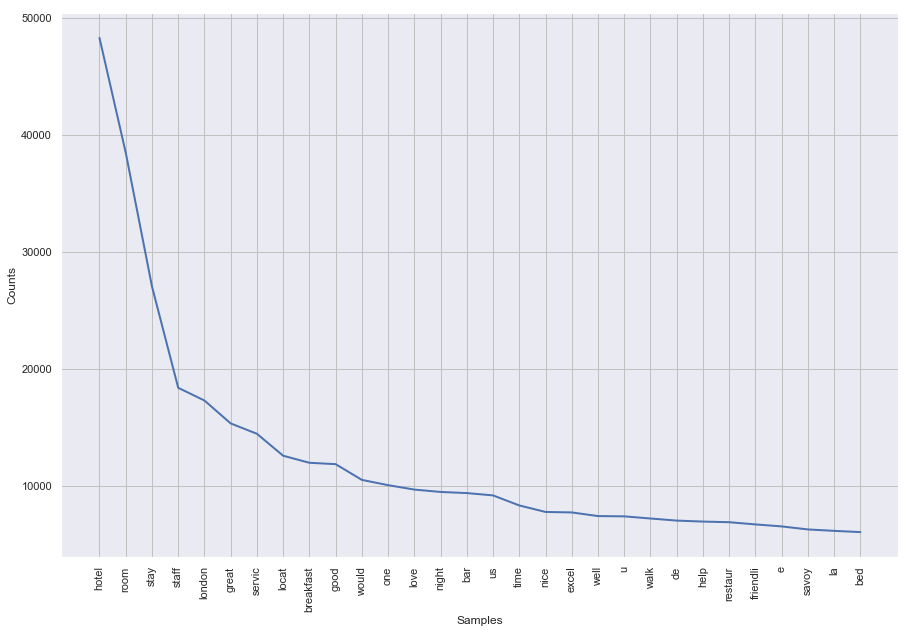

In [37]:
fdist.plot(30 ,cumulative=False)
plt.show()

## Stopwords

Stopwords considered as noise in the text. Text may contain stop words such as is, am, are, this, a, an, the, etc.
In NLTK for removing stopwords, you need to create a list of stopwords and filter out your list of tokens these words.

In [38]:
stop_words = set(stopwords.words("english"))
print(stop_words)

{'hadn', "she's", 'been', 'once', 'what', "you've", 'do', 'hasn', 'before', 'she', 'have', 'themselves', 'couldn', 'myself', 'over', "mustn't", 'under', "you'll", 'a', 'again', 'where', 'shan', 'your', 'isn', 'because', 'it', 'all', 'the', 'against', "couldn't", 'no', 'wasn', 'why', 'this', 'should', "should've", 'am', 'will', 'for', 'their', 'hers', 'very', 'an', 'at', 're', 'through', 'you', 'herself', 'that', 'them', 'doesn', 'ourselves', 'he', 'theirs', 'needn', 'himself', 'own', 'did', 'there', "don't", "didn't", 'only', 'than', 'wouldn', 'doing', 'my', 'such', "it's", 'yourselves', 'up', 'be', 'too', "hasn't", 'how', 'having', 'here', "doesn't", 'when', 'but', 'on', 'in', 'mustn', 'not', 'to', 'aren', 'by', 'll', 'more', 'until', "wasn't", 's', 'then', 'with', 't', 'or', 'does', 'we', 'during', 'nor', 'him', 'weren', 'off', 'those', 'being', 'same', 'his', 'were', "haven't", 'mightn', 'ours', 'itself', "shan't", 'its', "that'll", 'has', 'from', 'out', 'above', 'whom', 'haven', 'i

## Removing Stopwords

In [39]:
filtered_sent = []
for w in tokenized_word:
    if w not in stop_words:
        filtered_sent.append(w)
print("Tokenized Sentence:",tokenized_word)
print("Filterd Sentence:", filtered_sent)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [40]:
filtered_sent

['[',
 "'",
 'ottima',
 'qualit',
 'prezzo',
 'siamo',
 'stati',
 'londra',
 'per',
 'un',
 'week',
 'end',
 'ed',
 'abbiamo',
 'alloggiato',
 'questo',
 'ottimo',
 'hotel',
 'prenotato',
 'da',
 'amici',
 'personal',
 'molto',
 'gentil',
 'e',
 'disponibil',
 'camer',
 'sufficientement',
 'grandi',
 'soprattutto',
 'pulit',
 'e',
 'confortevoli',
 'con',
 'un',
 'letto',
 'matrimonial',
 'grand',
 'e',
 'comodo',
 'tv',
 'grand',
 'impianto',
 'stereo',
 'bose',
 'bagno',
 'grand',
 'con',
 'asciugacapelli',
 'vasca',
 'da',
 'bagno',
 'doccia',
 'accappatoio',
 'ciabatt',
 'ecc',
 'soprattutto',
 'pulito',
 'ottima',
 'posizion',
 'sebben',
 'sia',
 'nella',
 'zona',
 'finanziaria',
 'e',
 'quindi',
 'il',
 'fine',
 'settimana',
 'praticament',
 'deserta',
 'per',
 'noi',
 'stato',
 'fors',
 'un',
 'vantaggio',
 'per',
 'la',
 'tranquillit',
 'e',
 'visto',
 'che',
 'pochi',
 'minuti',
 'si',
 'raggiungono',
 'zone',
 'molto',
 'vivaci',
 'ogni',
 'caso',
 'muoversi',
 'non',
 'un',


## Stemming
Stemming is a process of linguistic normalization, which reduces words to their word root word or chops off connected, connecting word reduce to a common word "connect".

In [41]:
# Stemming 
ps = PorterStemmer()
stemmed_words = []
for w in filtered_sent:
    stemmed_words.append(ps.stem(w))

print("Filtered Sentence:", filtered_sent)
print("Stemmed Sentence:", stemmed_words)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Lemmatization 

Lemmatization reduces words to their base word, which is linguistically correct lemmas. It transforms root word with the use of vocabulary and morphological analysis. Lemmatization is usually more sophisticated than stemming. Stemmer works on an individual word without knowledge of the context. For example. The word "better" has " good" as it lemma. This thing will miss by stemming becouse it requires a dictionary look-up.

In [42]:
# Performing Stemming and Lemmatization 
    
from nltk.stem.wordnet import WordNetLemmatizer
lem = WordNetLemmatizer()

from nltk.stem.porter import PorterStemmer
stem = PorterStemmer()
#nltk.download('wordnet')

word='connecting'
print("Lemmatized Word:", lem.lemmatize(word,"v"))
print("Stemmed Word:",stem.stem(word))

Lemmatized Word: connect
Stemmed Word: connect


We can see the above code the word = “connecting” but final output of Lemmatized and Stemmed Word is “connect”. The connect is root word of connecting, Then the final root word is connect.